<a href="https://colab.research.google.com/github/alvianfirdaus/PCVK_Ganjil_2023/blob/main/Week_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---------------
# **PERTEMUAN 10**
## **Thresholding**
## **TI-3H**
---
**PROFIL MAHASISWA**<p>
Nama : Alvian Nur Firdaus<p>
Kelas : TI-3H<p>
Nim : 2141720022<p>
Wa : 081235026920<p>

<br>

--------------------------

## **D. TUGAS PRAKTIKUM Filter**

### **Buka https://colab.research.google.com/. Setelah dipastikan bahwa google Colab terhubung dengan Github Anda, lanjutkan dengan memilih repository yang telah digunakan pada praktikum minggu lalu, rename file menjadi “Week10.ipynb”.**

**Kemudian import folder yang ada di Drive Anda dengan cara sebagai berikut.**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **2. Import beberapa library berikut yang akan digunakan selama uji coba praktikum  minggu ke-6 berikut**

In [ ]:
!pip install pytesseract

In [ ]:
import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

### **3. Buat Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), denganthreshold= 170, secara manual sesuai dengan deskripsi dari grafik yang ditunjukkan di bawah**

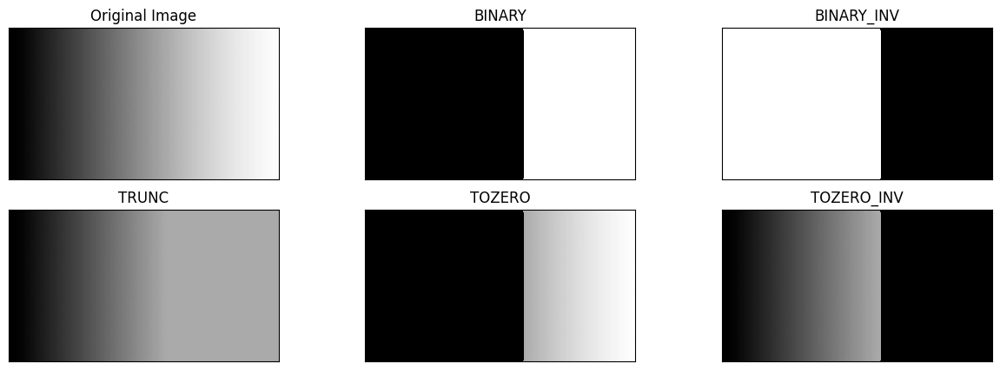

In [6]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
filename = ('/content/drive/MyDrive/Colab Notebooks/aset/Pertemuan10/gradient.jpg')
img = cv.imread(filename)
thresh = 170 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
ret,thresh1 = cv.threshold(img,thresh,255,cv.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv.threshold(img,thresh,255,cv.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv.threshold(img,thresh,255,cv.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

### **4. Buat Otsu Thresholding tanpa menggunakan Library. Tampilkan juga nilai threshold saat anda gunakan Otsu’s, seperti terlihat pada gambar hasil berikut. (gunakan image ktp Riyanto.jpg agar terlihat beda antara hasil otsu’s dengan global threshold biasa)**

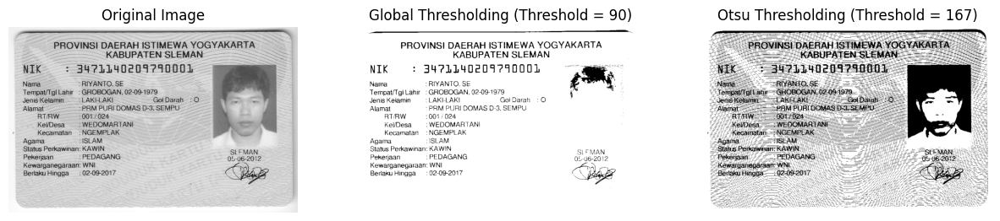

In [9]:
def otsu_thresholding(image):
    # Menghitung histogram gambar
    hist = cv2.calcHist([image], [0], None, [256], [0,256])
    hist_norm = hist.ravel() / hist.max()

    Q = hist_norm.cumsum()

    bins = np.arange(256)

    fn_min = np.inf
    thresh = -1

    for i in range(1, 256):
        p1, p2 = np.hsplit(hist_norm, [i])
        q1, q2 = Q[i], Q[255] - Q[i]
        if q1 == 0 or q2 == 0:
            continue

        b1, b2 = np.hsplit(bins, [i])

        # Menghitung varian di setiap threshold
        m1, m2 = np.sum(p1 * b1) / q1, np.sum(p2 * b2) / q2
        v1, v2 = np.sum(((b1 - m1) ** 2) * p1) / q1, np.sum(((b2 - m2) ** 2) * p2) / q2

        # Menghitung fungsi objektif untuk Otsu
        fn = v1 * q1 + v2 * q2
        if fn < fn_min:
            fn_min = fn
            thresh = i

    return thresh

def global_thresholding(image, threshold):
    ret, global_thresh = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    return global_thresh

# Baca gambar
image_path = '/content/drive/MyDrive/Colab Notebooks/aset/Pertemuan7/KTP_More/ktp.png'
img = cv2.imread(image_path, 0)  # Membaca gambar dalam skala keabuan

# Menentukan nilai threshold untuk global thresholding
global_thresh_value = 90

# Menggunakan Otsu's Thresholding
otsu_threshold = otsu_thresholding(img)
ret, otsu = cv2.threshold(img, otsu_threshold, 255, cv2.THRESH_BINARY)

# Melakukan Global Thresholding
global_img = global_thresholding(img, global_thresh_value)

# Menampilkan hasil
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(global_img, cmap='gray')
plt.title('Global Thresholding (Threshold = ' + str(global_thresh_value) + ')')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(otsu, cmap='gray')
plt.title('Otsu Thresholding (Threshold = ' + str(otsu_threshold) + ')')
plt.axis('off')

plt.show()

### **5.Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image saja.**
Gunakan image ktp Riyanto.jpg yang sudah disediakan di folder images.Petunjuk: <p>
a. anda dapat gunakan cv.calcHist untuk menampilkan histogram. <p>
b. Buka link berikut https://opencvtutorial.readthedocs.io/en/latest/histogram/histogram.html<p>
c. Dari link tersebut perhatikan bahwa cv.calcHist memiliki salah satu parameter yaitu mask. Jika diset None, maka keseluruhan image akan dihitung histogramnya. Jika kita tentukan mask, maka hanya bagian image yang dimasking warna putih yang akan dihitung histogramnya (dari conto dibawah dinamakan dengan Citra Segment).


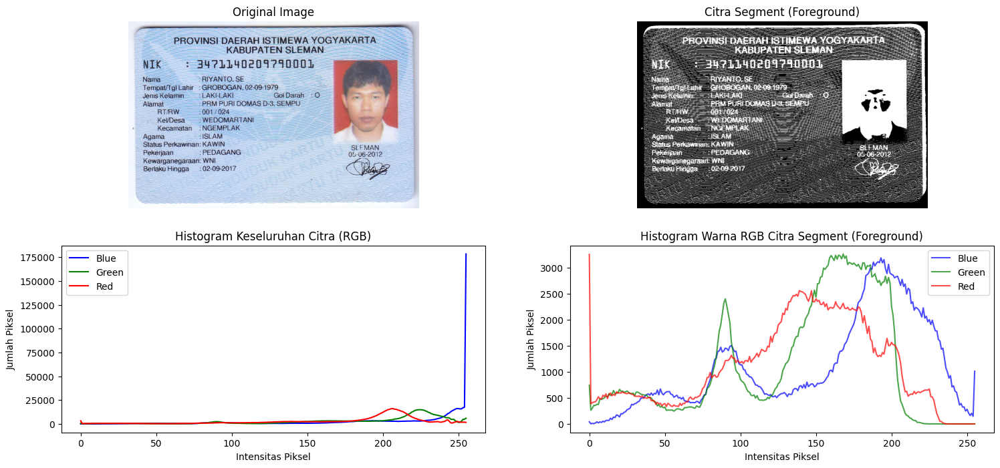

In [10]:
image_path = '/content/drive/MyDrive/Colab Notebooks/aset/Pertemuan7/KTP_More/ktp.png'
img = cv2.imread(image_path)

# Konversi ke citra keabuan
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Lakukan segmentasi (contoh: global thresholding)
ret, thresholded = cv2.threshold(gray_img, 200, 255, cv2.THRESH_BINARY)
foreground = cv2.bitwise_not(thresholded)

# Pisahkan saluran warna (BGR)
b, g, r = cv2.split(img)

# Hitung histogram untuk setiap saluran warna pada citra keseluruhan
hist_full_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_full_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_full_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Hitung histogram untuk setiap saluran warna pada citra segmentasi
hist_segmented_b = cv2.calcHist([b], [0], foreground, [256], [0, 256])
hist_segmented_g = cv2.calcHist([g], [0], foreground, [256], [0, 256])
hist_segmented_r = cv2.calcHist([r], [0], foreground, [256], [0, 256])

plt.figure(figsize=(18, 8))

# Tampilkan gambar asli
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Tampilkan citra segment (foreground)
plt.subplot(2, 2, 2)
plt.imshow(foreground, cmap='gray')
plt.title('Citra Segment (Foreground)')
plt.axis('off')

# Tampilkan histogram untuk keseluruhan citra (RGB)
plt.subplot(2, 2, 3)
plt.plot(hist_full_b, color='blue', label='Blue')
plt.plot(hist_full_g, color='green', label='Green')
plt.plot(hist_full_r, color='red', label='Red')
plt.title('Histogram Keseluruhan Citra (RGB)')
plt.xlabel('Intensitas Piksel')
plt.ylabel('Jumlah Piksel')
plt.legend()

# Tampilkan histogram warna RGB pada citra segment (foreground)
plt.subplot(2, 2, 4)
plt.plot(hist_segmented_b, color='blue', label='Blue', alpha=0.7)
plt.plot(hist_segmented_g, color='green', label='Green', alpha=0.7)
plt.plot(hist_segmented_r, color='red', label='Red', alpha=0.7)
plt.title('Histogram Warna RGB Citra Segment (Foreground)')
plt.xlabel('Intensitas Piksel')
plt.ylabel('Jumlah Piksel')
plt.legend()

plt.show()


### **6. Lakukan segmentasi warna pada image " ktp Riyanto.jpg ", munculkan hanya warna yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya warna tertentu saja)**

(<Axes: >, <matplotlib.image.AxesImage at 0x786c0b0f9270>)

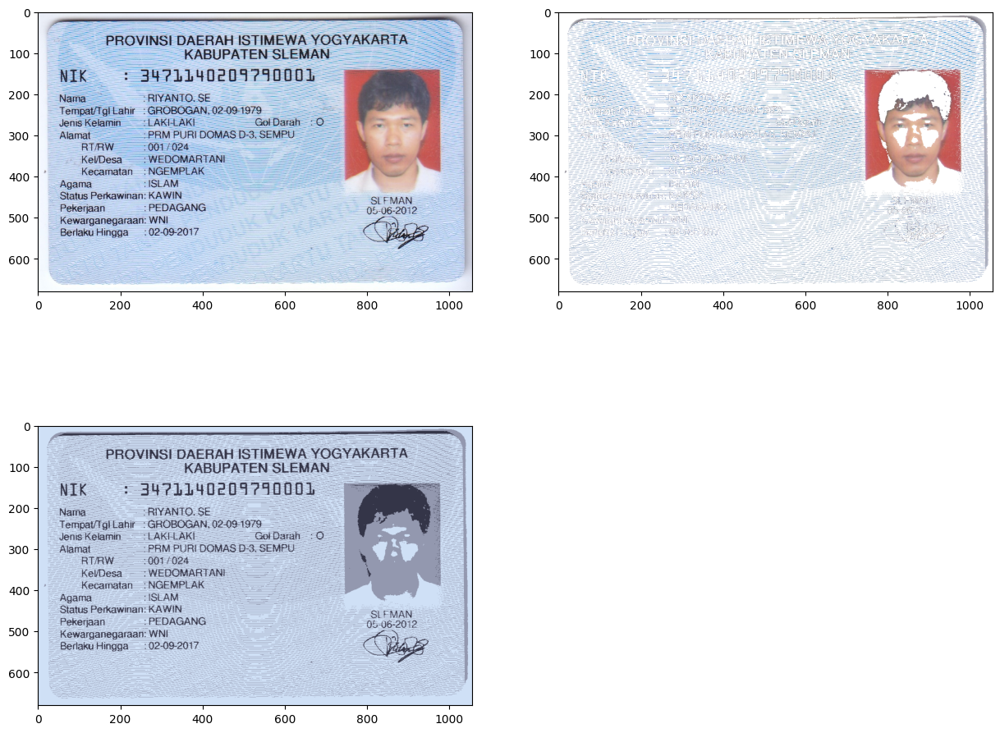

In [12]:
filename = ('/content/drive/MyDrive/Colab Notebooks/aset/Pertemuan7/KTP_More/ktp.png')
img6 = cv2.imread(filename)
img6 = cv2.cvtColor(img6 ,cv2.COLOR_BGR2RGB)

#reshape array ke bentuk 2D
pixel_values = img6.reshape((-1, 3))
# convert to float
pixel_values = np.float32(pixel_values)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 150, 0.1)

k = 3
_, labels, (centers) = cv2.kmeans(pixel_values, k, None,
criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

#konversi titik centroid kedalam integer
centers = np.uint8(centers)

#flattening label array
labels = labels.flatten()

#konversi warna pixel asli kewarna dari tiap centroidnya
segmented_image = centers[labels.flatten()]

# reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img6.shape)

# membuat model masked image
masked_image = np.copy(img6)
masked_image0 = masked_image.reshape((-1, 3))
masked_image0[labels != 2] = [255, 255, 255]
masked_image0 = masked_image0.reshape(img6.shape)

plt.figure(figsize = (15,12))
plt.subplot(2,2,1),plt.imshow(img6)
plt.subplot(2,2,2),plt.imshow(masked_image0)
plt.subplot(2,2,3),plt.imshow(segmented_image)

### **E. Tugasnya adalah mengimplementasikan thresholding dengan beberapa metode ytelah Anda ketahui untuk melakukan segmentasi pada dataset KTP pertemuan 7.**


In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # path cv2.imshow di google colab
import os
import random
from sklearn.cluster import KMeans
import math


In [16]:
directory='/content/drive/MyDrive/Colab Notebooks/aset/Pertemuan7/KTP_More'

image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)

### **Melakukan Segmentasi Global Thresholding**

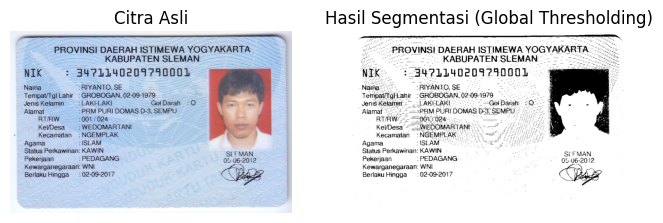

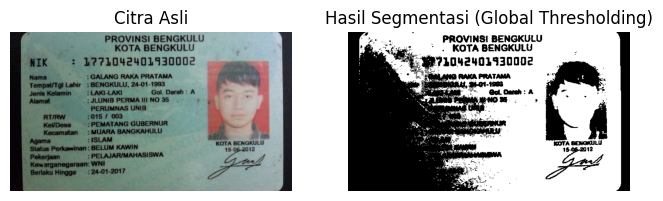

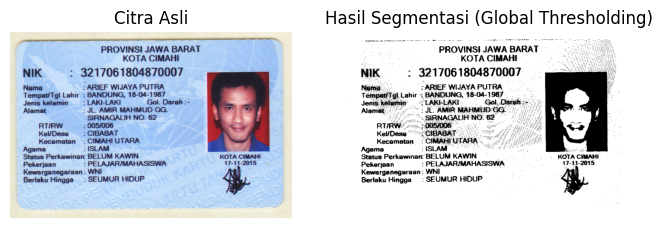

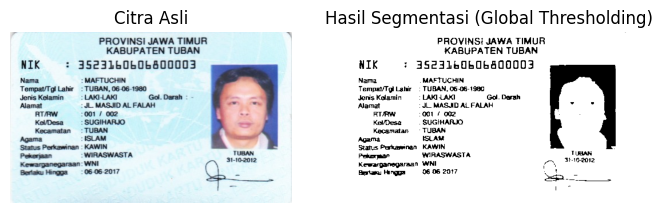

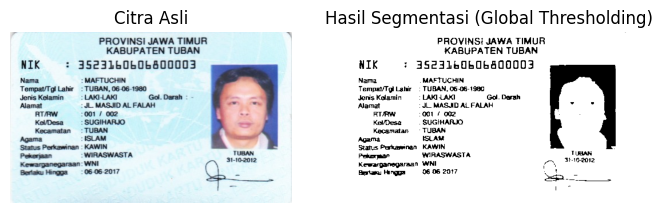

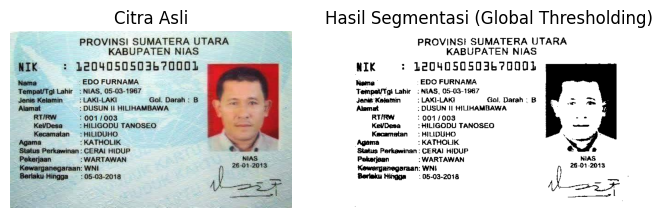

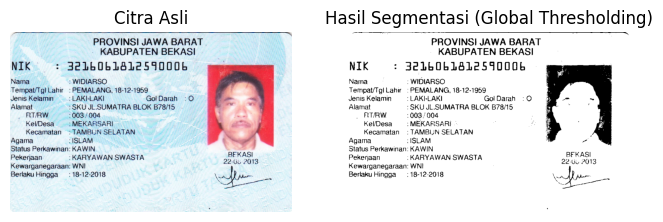

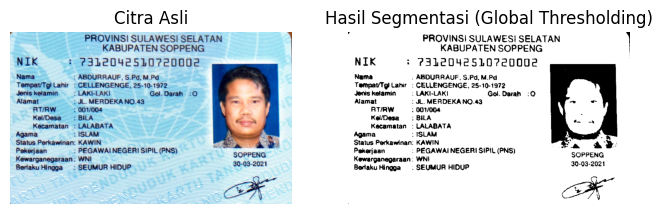

In [21]:
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Melakukan global thresholding
    ret, thresholded = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Global Thresholding)')
    plt.axis('off')

    plt.show()

### **Melakukan Segmentasi Adaptive Thresholding**

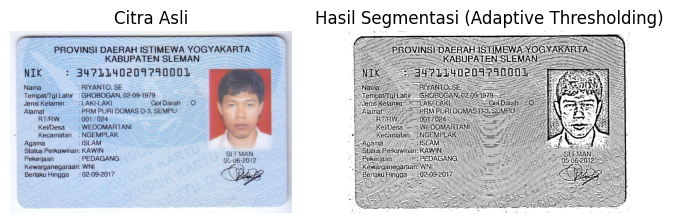

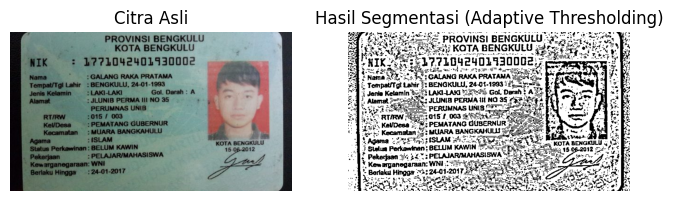

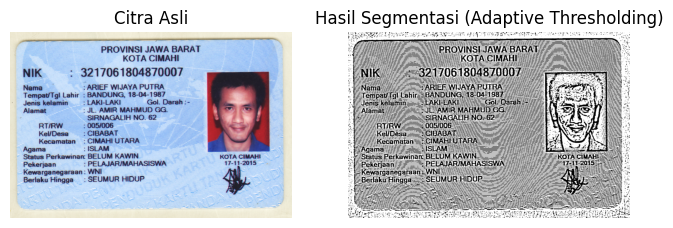

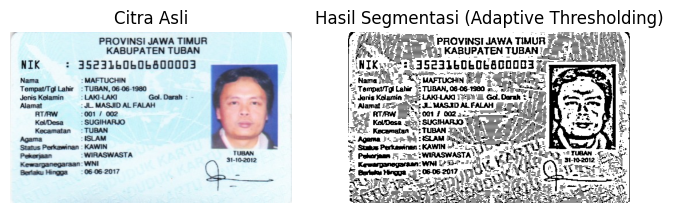

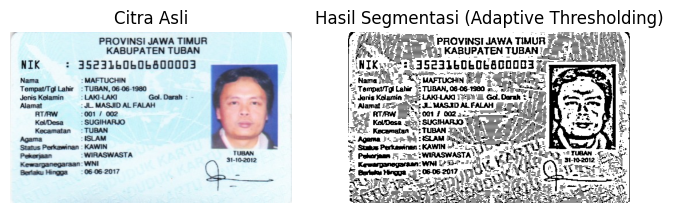

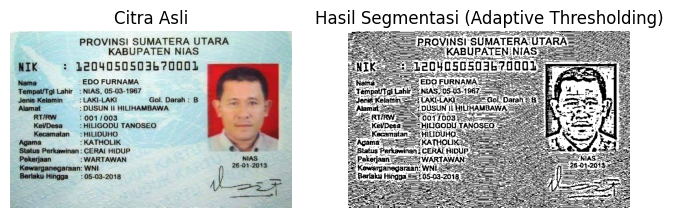

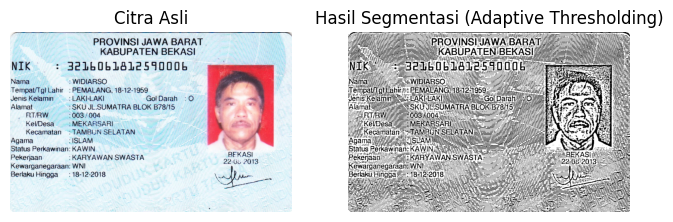

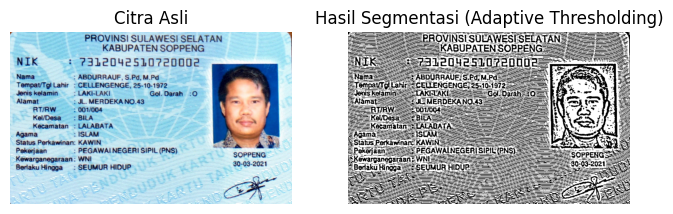

In [22]:
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Melakukan adaptive thresholding
    thresholded = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Adaptive Thresholding)')
    plt.axis('off')

    plt.show()

### **Segmentasi Otsu's Thresholding**

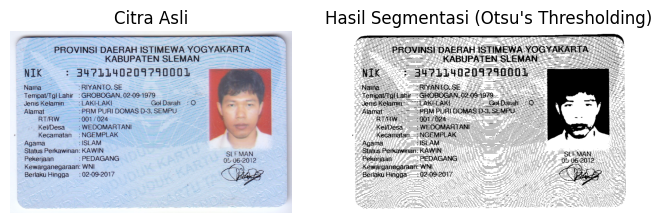

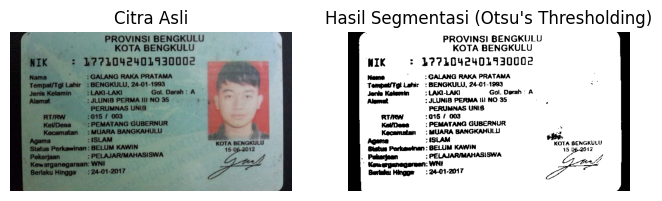

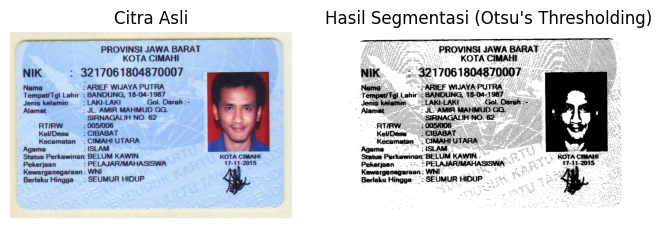

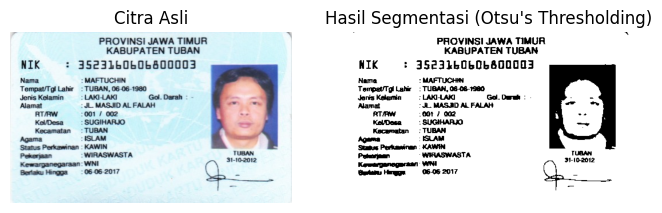

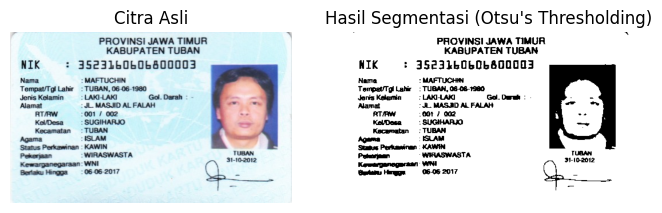

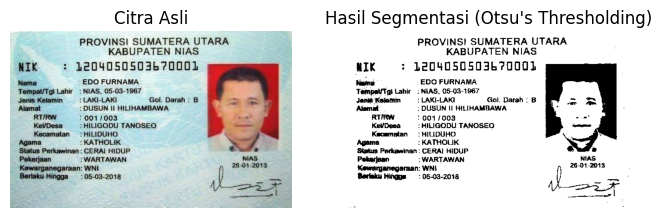

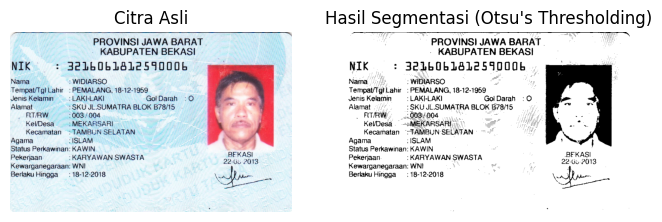

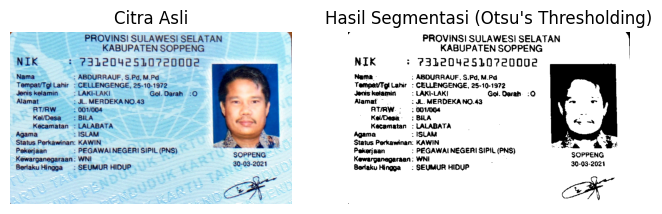

In [23]:
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Melakukan Otsu's Thresholding
    _, thresholded = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Otsu\'s Thresholding)')
    plt.axis('off')

    plt.show()


### **Segmentasi K-Means**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


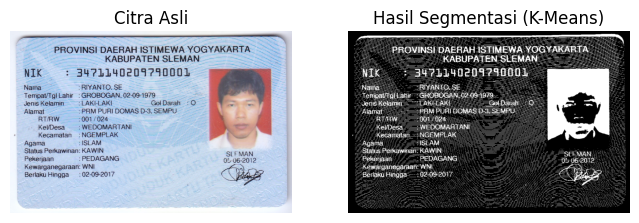

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


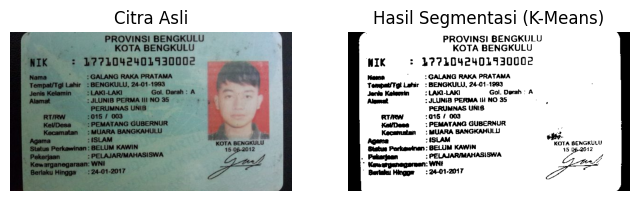

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


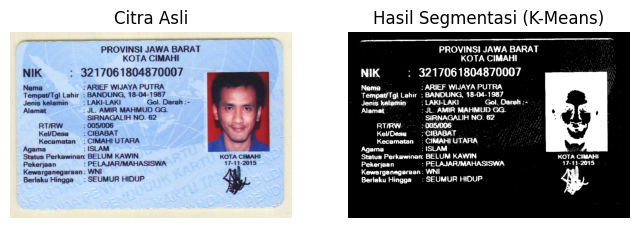

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


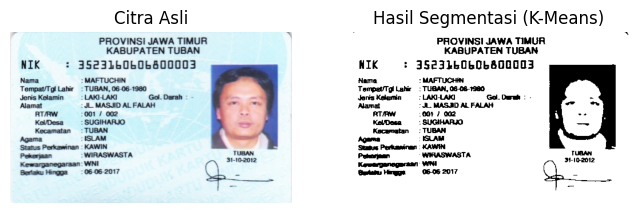

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


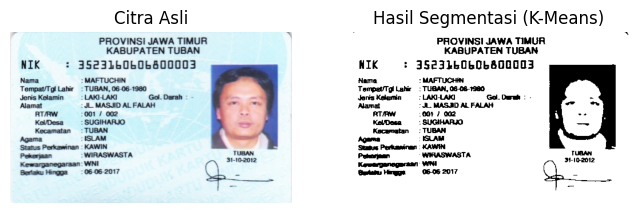

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


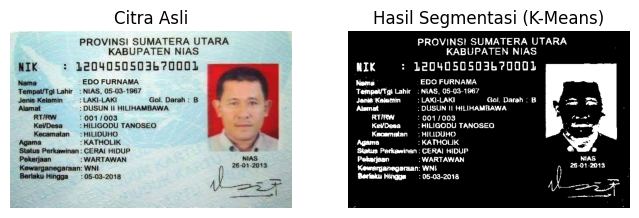

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


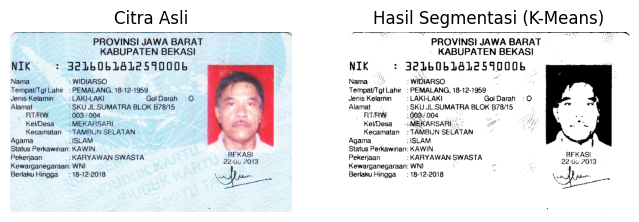

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


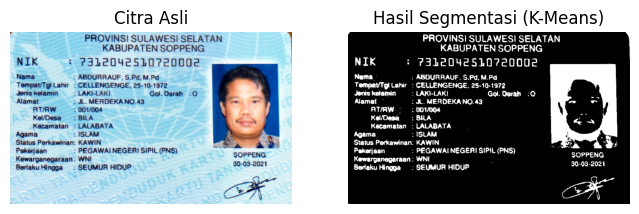

In [24]:
from sklearn.cluster import KMeans
# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Melakukan Otsu's Thresholding
    _, thresholded = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Ubah citra ke format yang dapat dikerjakan oleh K-Means
    img_flat = img.reshape((-1, 3))
    img_flat = np.float32(img_flat)

    # K-Means
    kmeans = KMeans(n_clusters=2, random_state=0)
    labels = kmeans.fit_predict(img_flat)
    segmented = labels.reshape(img.shape[0], img.shape[1])

    # Menampilkan gambar asli dan hasil segmentasi K-Means
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(segmented, cmap='gray')
    plt.title('Hasil Segmentasi (K-Means)')
    plt.axis('off')

    plt.show()

### **Terima Kasih**